In [ ]:
# Classifications of Healthy vs diesease during Schizophrenia
# import dependencies

In [1]:
import os
import numpy as np
import mne
from glob import glob
import matplotlib.pyplot as plt
from sklearn.linear_model import LogisticRegression
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import GroupKFold,GridSearchCV
import zipapp

In [ ]:
#Creating list of files

In [2]:
edf_files=glob('extraction_directory/*.edf')

In [3]:
print(len(edf_files))

28


In [4]:
ls


 dataverse_files.zip
 EEG_LSTM_good_accuracy.ipynb
 extraction_directory/
 extraction_directory.zip
 logistic_regression_model.pkl
'Schizophrenia_healthy_vs Disease_classification.ipynb'
 Shoorangiz__2021.pdf
 test/
 Untitled1.ipynb
 Untitled.ipynb
'Values for Pawan to plot.xlsx'


In [5]:
print(edf_files)

['extraction_directory/h03.edf', 'extraction_directory/h11.edf', 'extraction_directory/s05.edf', 'extraction_directory/s08.edf', 'extraction_directory/h12.edf', 'extraction_directory/s14.edf', 'extraction_directory/h10.edf', 'extraction_directory/s02.edf', 'extraction_directory/h08.edf', 'extraction_directory/h02.edf', 'extraction_directory/h04.edf', 'extraction_directory/h06.edf', 'extraction_directory/s04.edf', 'extraction_directory/s11.edf', 'extraction_directory/s06.edf', 'extraction_directory/h05.edf', 'extraction_directory/s07.edf', 'extraction_directory/h07.edf', 'extraction_directory/h14.edf', 'extraction_directory/h09.edf', 'extraction_directory/h01.edf', 'extraction_directory/s12.edf', 'extraction_directory/h13.edf', 'extraction_directory/s03.edf', 'extraction_directory/s09.edf', 'extraction_directory/s13.edf', 'extraction_directory/s10.edf', 'extraction_directory/s01.edf']


In [ ]:
#healthy_file_path will contain only those elements from edf_files 
#for which the letter 'h' is present in the second part of the file path after splitting it using '/

In [6]:
healthy_file_path=[i for i in edf_files if 'h' in i.split('/')[1]]

In [7]:
print(len(healthy_file_path))

14


In [ ]:
#patient_file_path will contain only those elements from edf_files 
#for which the letter 's' is present in the second part of the file path after splitting it using '/

In [8]:
patient_file_path=[i for i in edf_files if 's' in i.split('/')[1]]

Bandpass Filter:
Purpose: It allows a specific frequency range of interest to pass through while attenuating frequencies outside this range.
Use Case: To focus on a particular frequency band relevant to the experimental or analytical goals (e.g., theta, alpha, beta bands).
Notch Filter:
Purpose: It attenuates a narrow band of frequencies, typically centered around a specific frequency, to remove power line noise or other narrowband interference.
Use Case: To eliminate unwanted noise or artifacts at specific frequencies, such as power line interference (e.g., 50 or 60 Hz).

Creating epochs in EEG:

Segmentation: Divides continuous data for analysis.
Event-Related Potentials (ERP): Essential for studying neural responses to events.
Artifact Rejection: Identifies/removes noisy epochs.
Baseline Correction: Adjusts for baseline shifts.
Flexibility: Allows for defined analysis windows.

In [9]:
def read_data(file_path):
    # Load the EEG data from the EDF file with preload=True
    
    '''#This command uses the MNE-Python library to read EEG data 
    #from an EDF file specified by file_path. The preload=True option loads the data into memory immediately.'''
    
    data=mne.io.read_raw_edf(file_path,preload=True)
    
    '''This command sets the EEG reference to the default (average reference) 
    #if it's not already set. The set_eeg_reference() function is used for this purpose.
    # Set EEG reference (if not already set)'''
    
    data.set_eeg_reference()
    
    '''This command applies a bandpass filter to 
    the EEG data, retaining frequencies between 0.5 Hz and 45 Hz.'''
    
    # Apply a bandpass filter from 0.5 Hz to 45 Hz
    data.filter(l_freq=0.5,h_freq=45)
    
    
        # Apply a notch filter to remove power line noise (50 Hz)
    data.notch_filter(freqs=50)
    # Create epochs with a fixed length of 5 seconds and 1-second overlap
    epochs=mne.make_fixed_length_epochs(data,duration=5,overlap=1)
    # Load data into memory (necessary for ICA) 
     # Load data into memory (necessary for ICA)                                   )
    epochs.load_data()
    # Apply Independent Component Analysis (ICA) for artifact removal                                    
    ica = mne.preprocessing.ICA(n_components=5, random_state=97, max_iter=800)
    ica.fit(epochs)
    epochs = ica.apply(epochs)
    # Reject epochs with high amplitude (adjust the threshold as needed)
    epochs.drop_bad(reject={'eeg': 100e-6}) 
    #Baseline correction (adjust the baseline period as needed)
    epochs.apply_baseline((0, 4.996))  # Correct the baseline to the period from -0.5 to 0 seconds
    bad_channels = epochs.info['bads']
     # Reset bad channels (if desired)
    epochs.info['bads'] = []
     # Get the EEG data as a NumPy array  
    # Spatial Filtering (e.g., surface Laplacian)
    epochs.set_eeg_reference('average', projection=False)
     # Reset bad channels (if desired)
    epochs.info['bads'] = []
     # Get the EEG data as a NumPy array  
    # Spatial Filtering (e.g., surface Laplacian)
    epochs.set_eeg_reference('average', projection=False)
         
        # Decimation (downsampling to a lower sampling rate)
    epochs.resample(100)  # Replace '100' with your desired new sampling rate
            
    array=epochs.get_data()
    return array
    


In [10]:
%%capture
control_epochs_array=[read_data(i) for i in healthy_file_path]
patient_epochs_array=[read_data(i) for i in patient_file_path]

In [11]:
# Creating labels
control_epoch_labels=[len(i)*[0] for i in control_epochs_array]
patient_epoch_labels=[len(i)*[1] for i in patient_epochs_array]
len(control_epoch_labels),len(patient_epoch_labels)

(14, 14)

In [12]:
data_list=control_epochs_array+patient_epochs_array
label_list=control_epoch_labels+patient_epoch_labels

In [13]:
np.size(data_list)

/home/pawan/anaconda3/lib/python3.10/site-packages/numpy/core/fromnumeric.py:3202: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  return asarray(a).size


28

In [14]:
# Create a group list
group_list=[[i]*len(j) for i,j in enumerate(data_list)]

In [15]:
# Convert the list to array
data_array=np.vstack(data_list)
label_array=np.hstack(label_list)
group_array=np.hstack(group_list)
print(data_array.shape,label_array.shape,group_array.shape)

(5482, 19, 500) (5482,) (5482,)


In [16]:
#Now
# Extract feature from the raw data
from scipy import stats
def mean(x):
    return np.mean(x,axis=-1)
def std(x):
    return np.std(x, axis=-1)
def ptp(x):
    return np.ptp(x, axis=-1)
def var(x):
    return np.var(x,axis=-1)
def minim(x):
    return np.min(x,axis=-1)
def maxim(x):
    return np.max(x,axis=-1)
def argminim(x):
    return np.argmin(x,axis=-1)
def argmaxim(x):
    return np.argmax(x,axis=-1)
def sqrt(x):
    return np.sqrt(np.mean(x ** 2, axis=-1))
def abs_diff_sigma(x):
    return np.sum(np.abs(np.diff(x,axis=-1)),axis=-1)
def skew(x):
    return stats.skew(x,axis=-1)
def kurtosis(x):
    return stats.kurtosis(x,axis=-1)
def concatenate_features(x):
    return np.concatenate((mean(x),std(x),ptp(x),var(x),minim(x),maxim(x),argminim(x),
 argmaxim(x),sqrt(x),abs_diff_sigma(x),skew(x),
    kurtosis(x)),axis=-1)

In [17]:
features=[]
for d in data_array:
    features.append(concatenate_features(d))

In [18]:
features_array=np.array(features)
features_array.shape

(5482, 228)

In [19]:

#Model
clf=LogisticRegression(max_iter=1000)
gkf=GroupKFold(5)
pipe=Pipeline([('scaler',StandardScaler()),('clf',clf)])
param_grid={'clf__C':[.1,.5,.7,1,3,5,7]}
gscv=GridSearchCV(pipe,param_grid,cv=gkf,n_jobs=12)
gscv.fit(features_array,label_array,groups=group_array)

GridSearchCV(cv=GroupKFold(n_splits=5),
             estimator=Pipeline(steps=[('scaler', StandardScaler()),
                                       ('clf',
                                        LogisticRegression(max_iter=1000))]),
             n_jobs=12, param_grid={'clf__C': [0.1, 0.5, 0.7, 1, 3, 5, 7]})

In [20]:
gscv.best_score_

0.7265968617950622

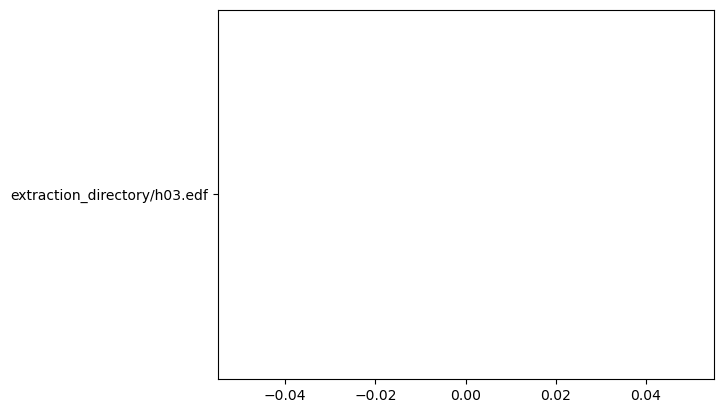

In [21]:
plt.plot(healthy_file_path[0])

Extracting EDF parameters from /home/pawan/Downloads/Ghanim_machine_learning/data_code/extraction_directory/h03.edf...
EDF file detected
Setting channel info structure...
Creating raw.info structure...
Reading 0 ... 227499  =      0.000 ...   909.996 secs...
Using matplotlib as 2D backend.


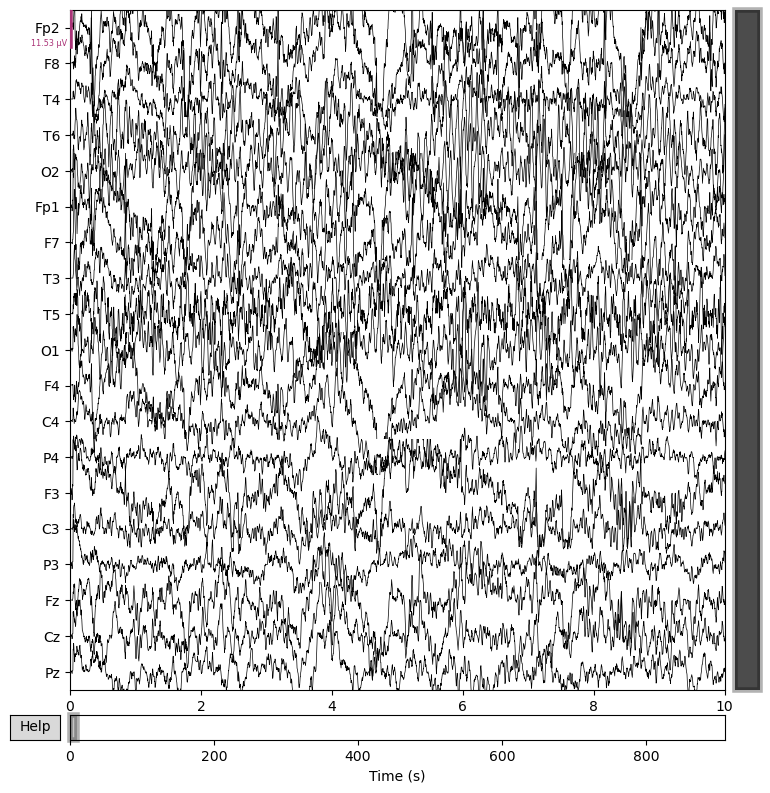

Extracting EDF parameters from /home/pawan/Downloads/Ghanim_machine_learning/data_code/extraction_directory/h11.edf...
EDF file detected
Setting channel info structure...
Creating raw.info structure...
Reading 0 ... 228749  =      0.000 ...   914.996 secs...


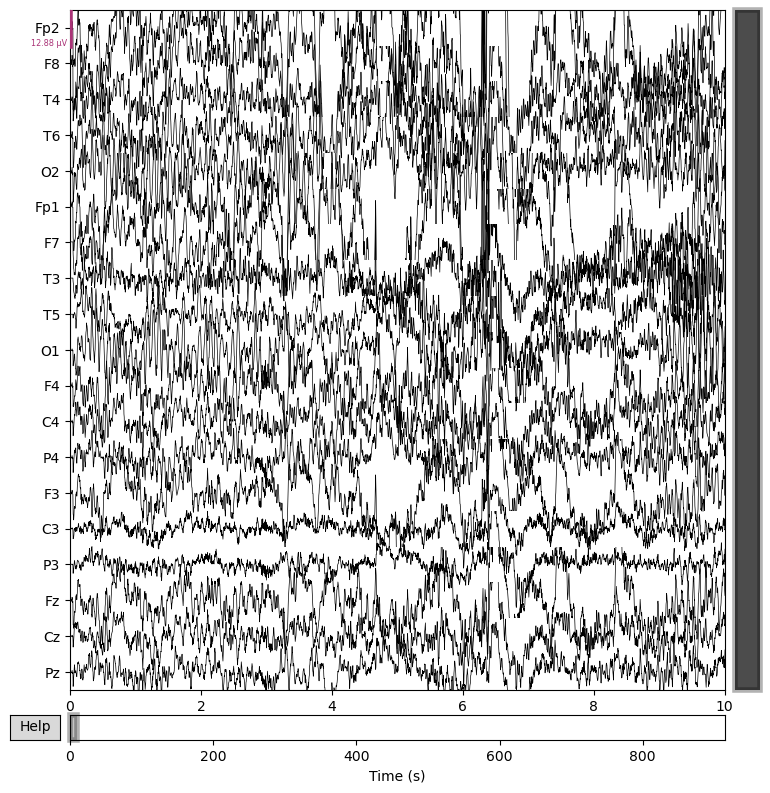

Extracting EDF parameters from /home/pawan/Downloads/Ghanim_machine_learning/data_code/extraction_directory/s05.edf...
EDF file detected
Setting channel info structure...
Creating raw.info structure...
Reading 0 ... 222499  =      0.000 ...   889.996 secs...


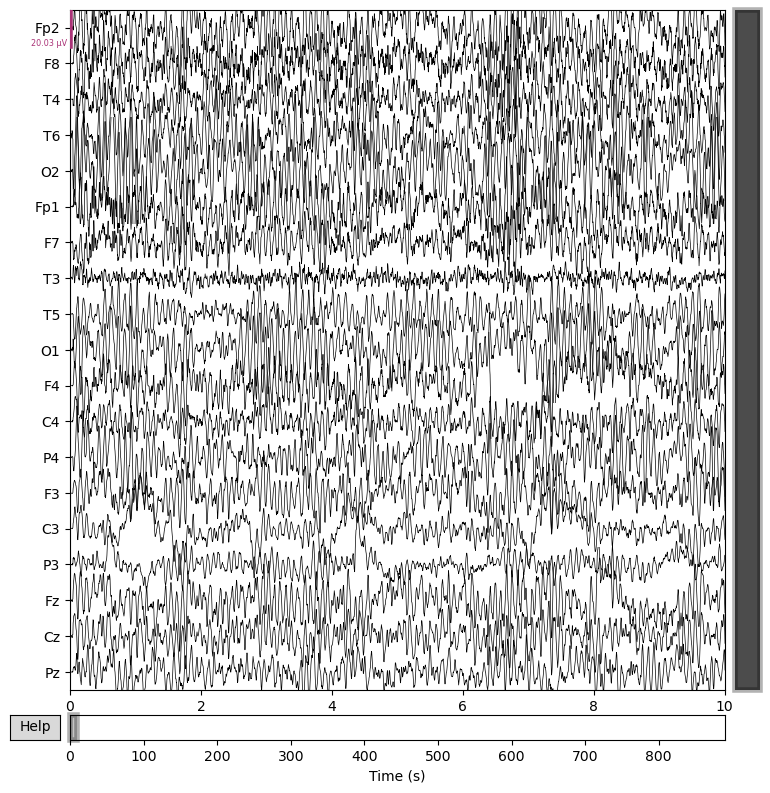

Extracting EDF parameters from /home/pawan/Downloads/Ghanim_machine_learning/data_code/extraction_directory/s08.edf...
EDF file detected
Setting channel info structure...
Creating raw.info structure...
Reading 0 ... 227749  =      0.000 ...   910.996 secs...


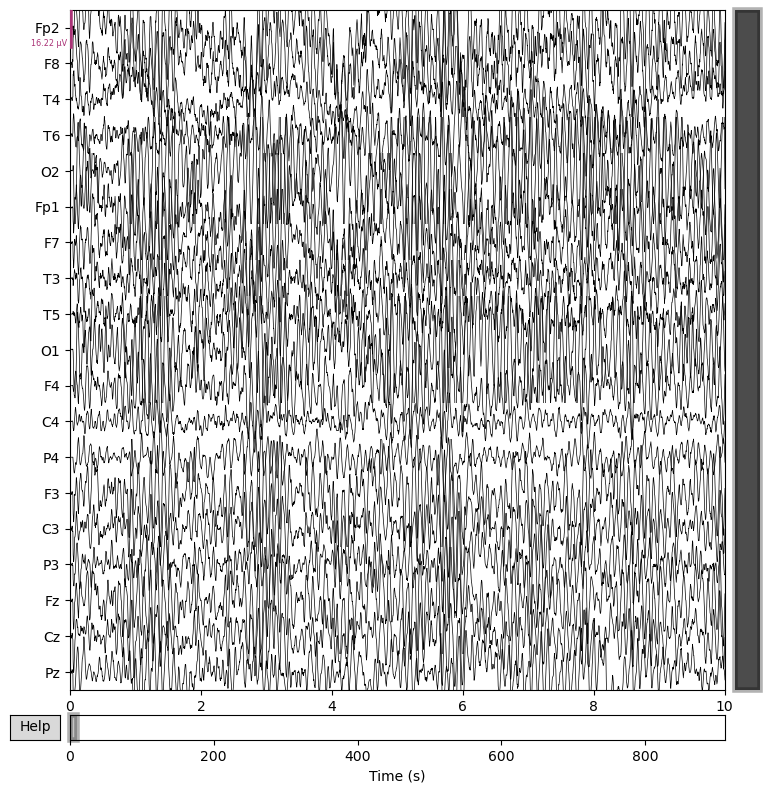

Extracting EDF parameters from /home/pawan/Downloads/Ghanim_machine_learning/data_code/extraction_directory/h12.edf...
EDF file detected
Setting channel info structure...
Creating raw.info structure...
Reading 0 ... 224999  =      0.000 ...   899.996 secs...


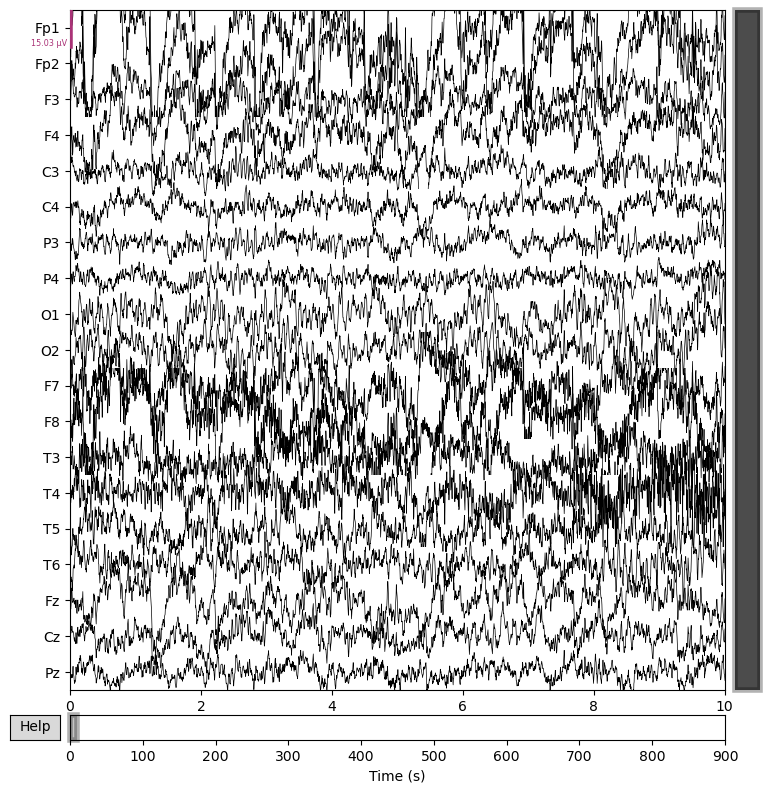

Extracting EDF parameters from /home/pawan/Downloads/Ghanim_machine_learning/data_code/extraction_directory/s14.edf...
EDF file detected
Setting channel info structure...
Creating raw.info structure...
Reading 0 ... 542499  =      0.000 ...  2169.996 secs...


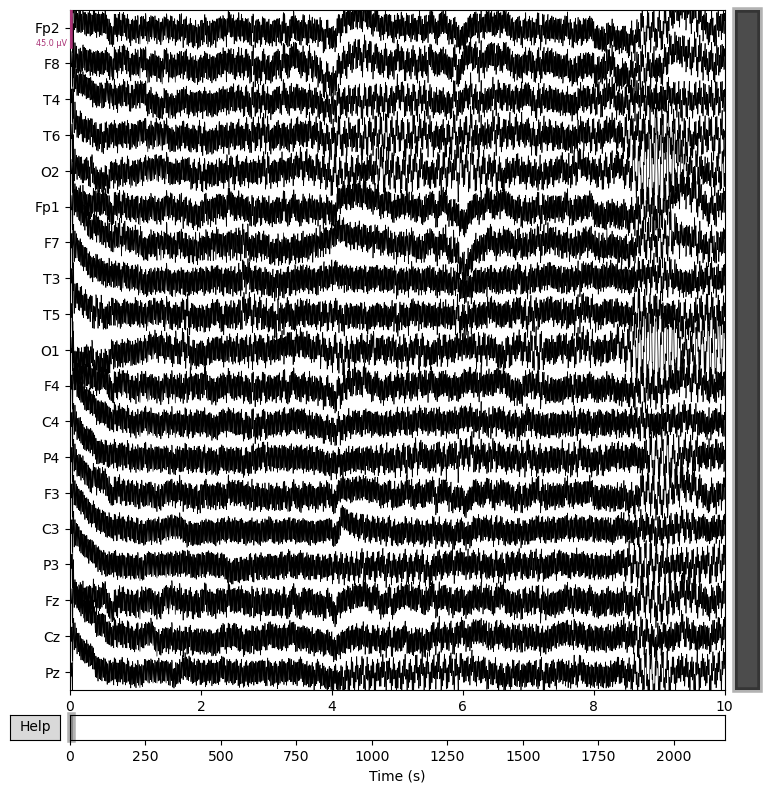

Extracting EDF parameters from /home/pawan/Downloads/Ghanim_machine_learning/data_code/extraction_directory/h10.edf...
EDF file detected
Setting channel info structure...
Creating raw.info structure...
Reading 0 ... 278749  =      0.000 ...  1114.996 secs...


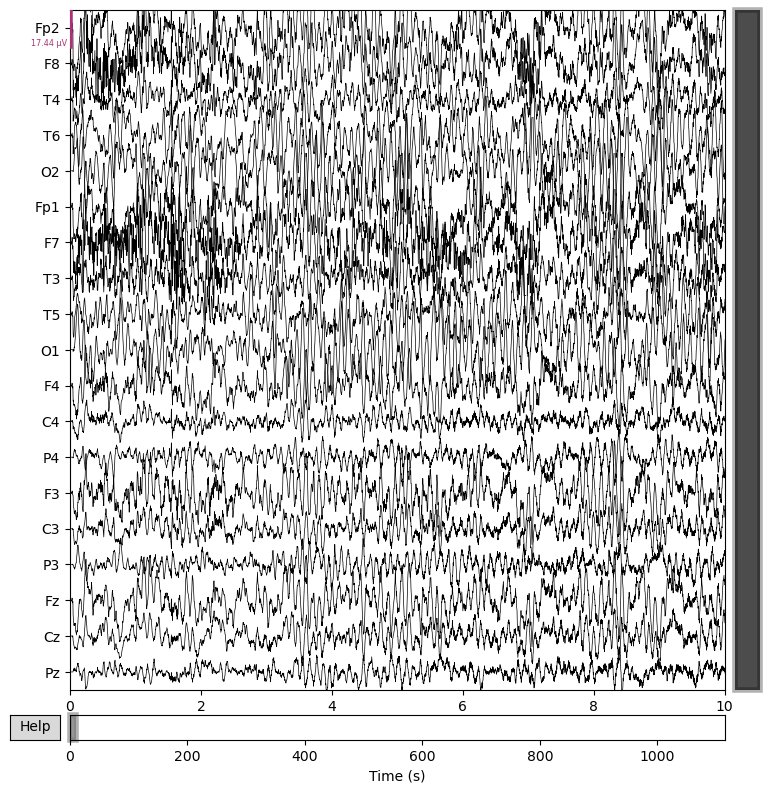

Extracting EDF parameters from /home/pawan/Downloads/Ghanim_machine_learning/data_code/extraction_directory/s02.edf...
EDF file detected
Setting channel info structure...
Creating raw.info structure...
Reading 0 ... 286249  =      0.000 ...  1144.996 secs...


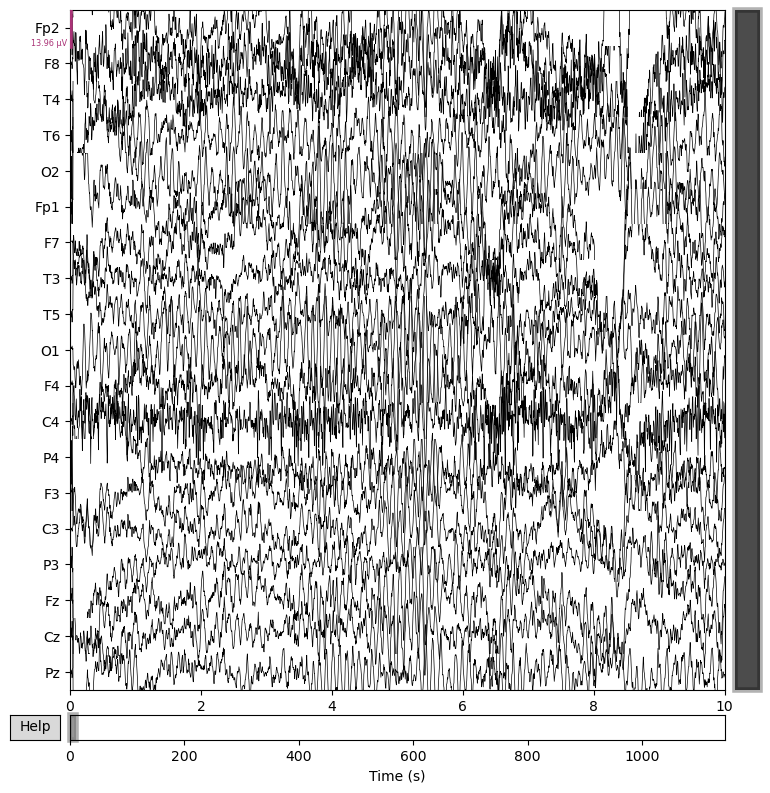

Extracting EDF parameters from /home/pawan/Downloads/Ghanim_machine_learning/data_code/extraction_directory/h08.edf...
EDF file detected
Setting channel info structure...
Creating raw.info structure...
Reading 0 ... 227499  =      0.000 ...   909.996 secs...


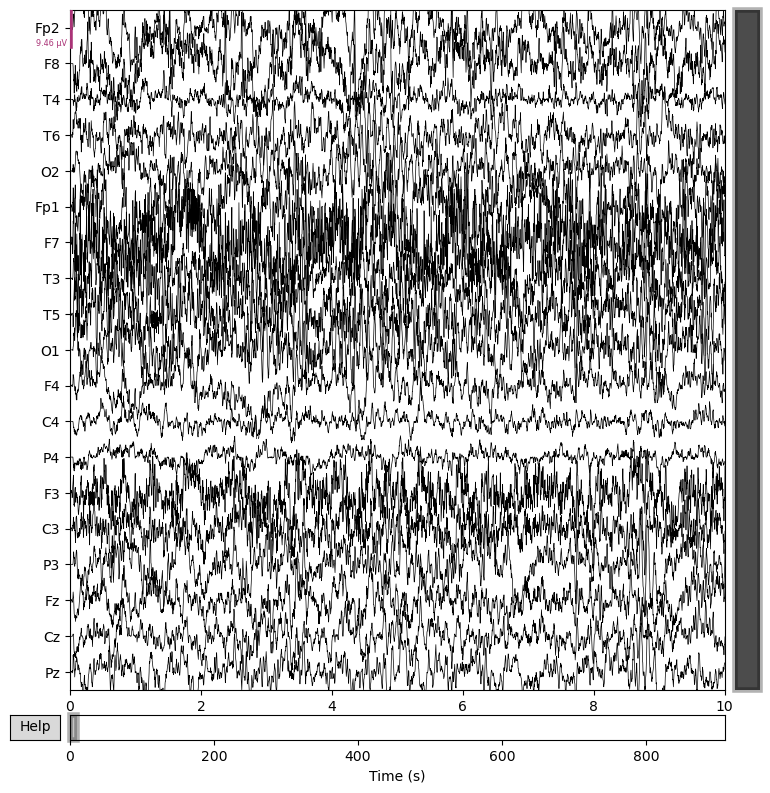

Extracting EDF parameters from /home/pawan/Downloads/Ghanim_machine_learning/data_code/extraction_directory/h02.edf...
EDF file detected
Setting channel info structure...
Creating raw.info structure...
Reading 0 ... 227499  =      0.000 ...   909.996 secs...


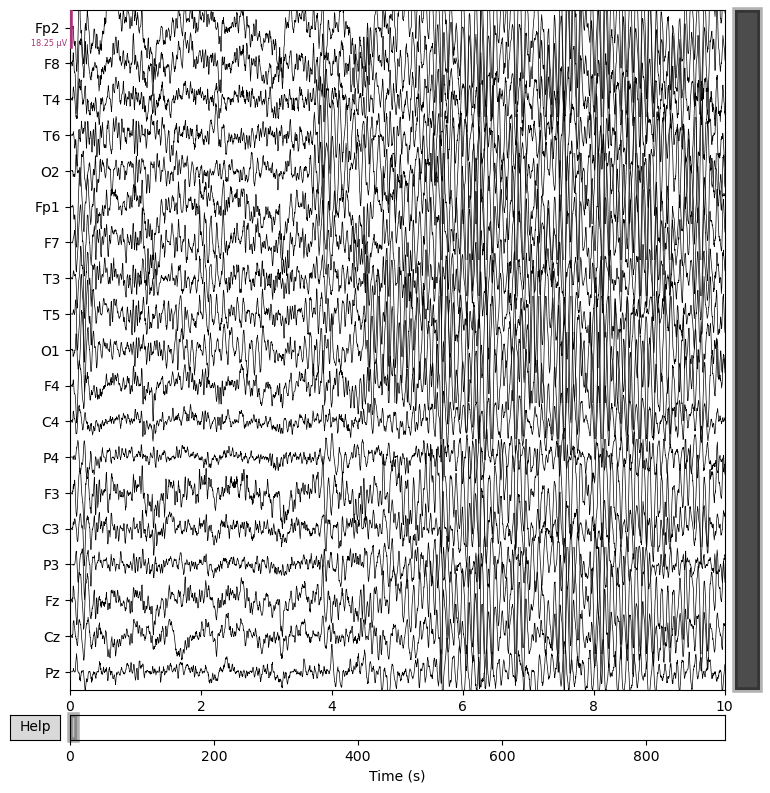

Extracting EDF parameters from /home/pawan/Downloads/Ghanim_machine_learning/data_code/extraction_directory/h04.edf...
EDF file detected
Setting channel info structure...
Creating raw.info structure...
Reading 0 ... 231249  =      0.000 ...   924.996 secs...


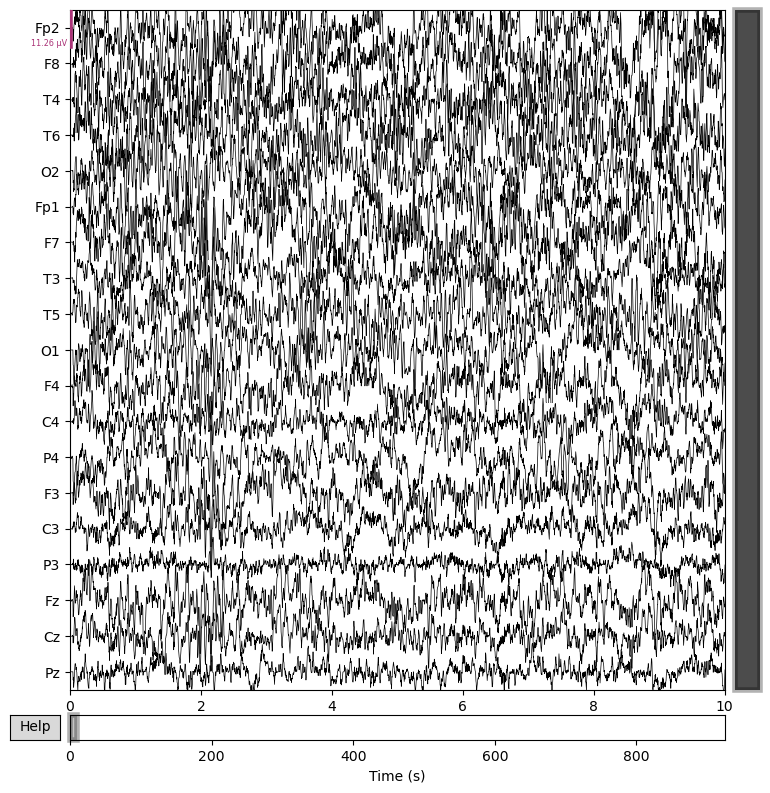

Extracting EDF parameters from /home/pawan/Downloads/Ghanim_machine_learning/data_code/extraction_directory/h06.edf...
EDF file detected
Setting channel info structure...
Creating raw.info structure...
Reading 0 ... 232499  =      0.000 ...   929.996 secs...


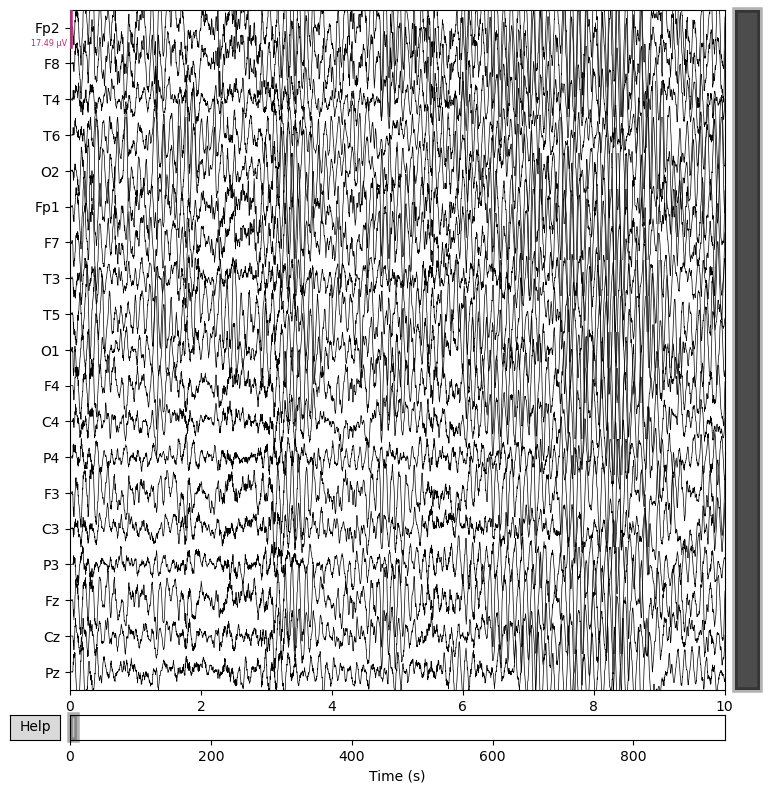

Extracting EDF parameters from /home/pawan/Downloads/Ghanim_machine_learning/data_code/extraction_directory/s04.edf...
EDF file detected
Setting channel info structure...
Creating raw.info structure...
Reading 0 ... 301249  =      0.000 ...  1204.996 secs...


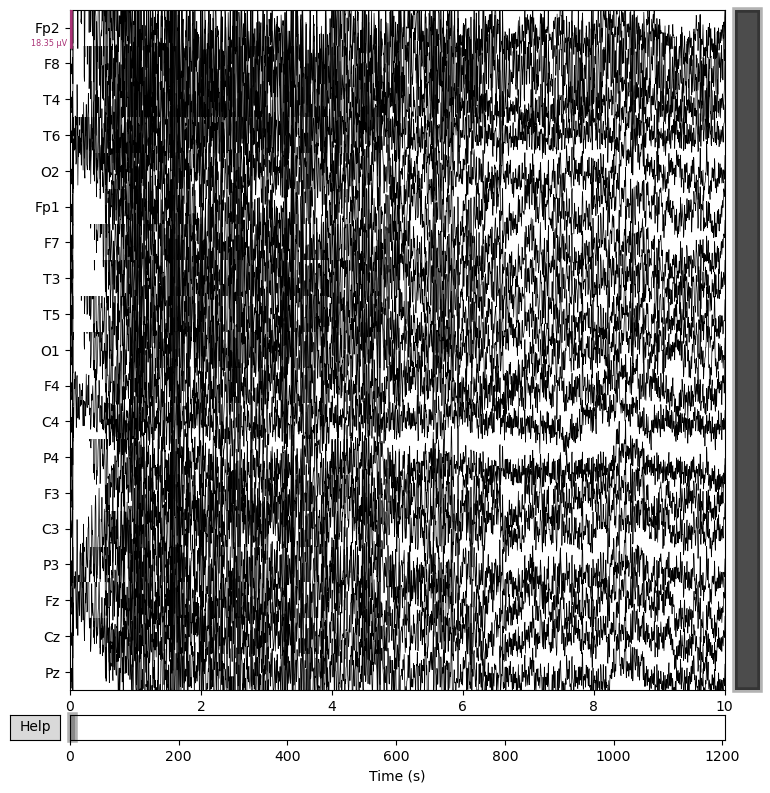

Extracting EDF parameters from /home/pawan/Downloads/Ghanim_machine_learning/data_code/extraction_directory/s11.edf...
EDF file detected
Setting channel info structure...
Creating raw.info structure...
Reading 0 ... 339999  =      0.000 ...  1359.996 secs...


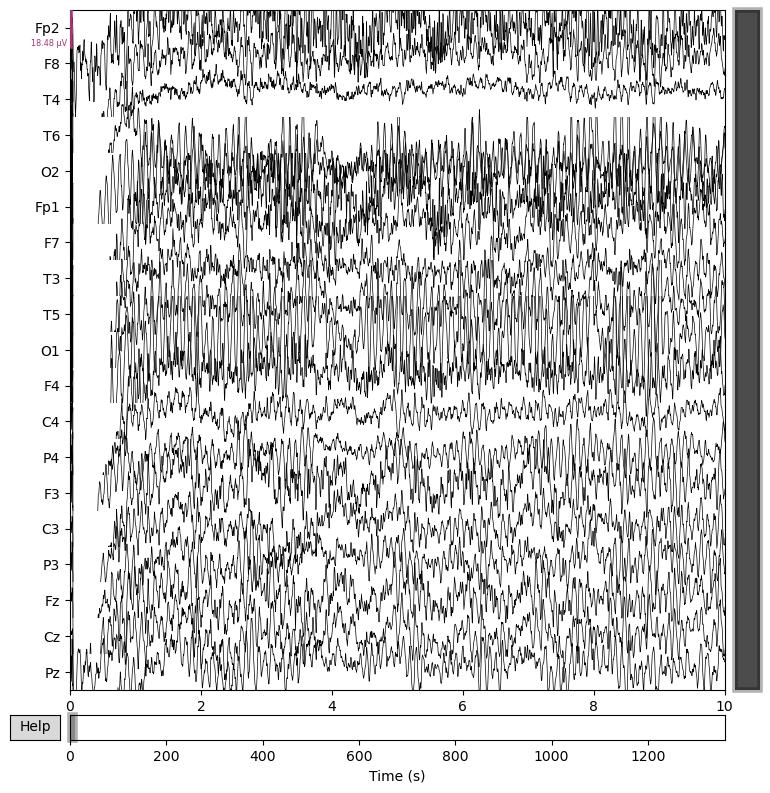

Extracting EDF parameters from /home/pawan/Downloads/Ghanim_machine_learning/data_code/extraction_directory/s06.edf...
EDF file detected
Setting channel info structure...
Creating raw.info structure...
Reading 0 ... 184999  =      0.000 ...   739.996 secs...


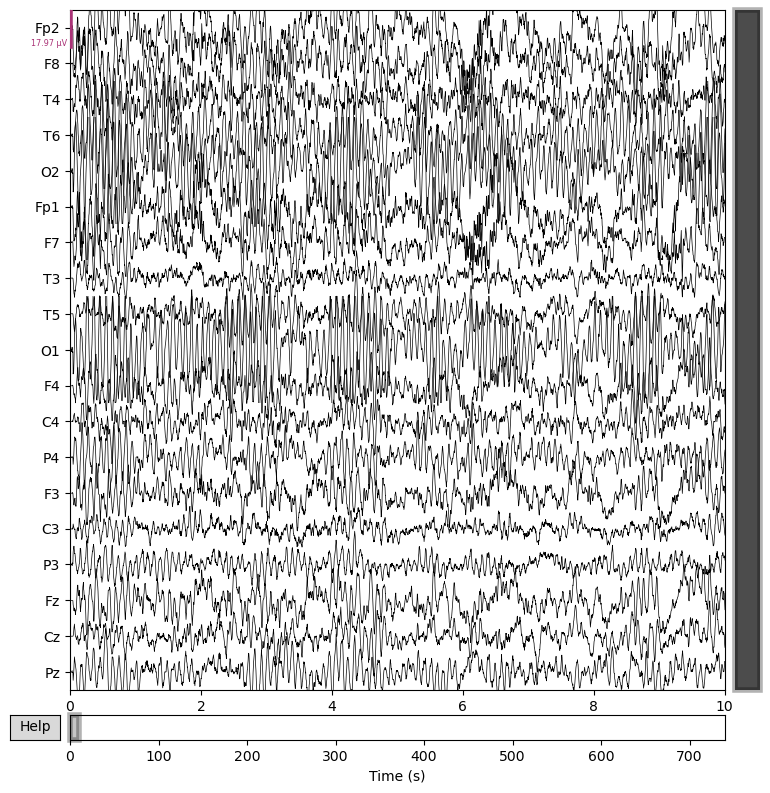

Extracting EDF parameters from /home/pawan/Downloads/Ghanim_machine_learning/data_code/extraction_directory/h05.edf...
EDF file detected
Setting channel info structure...
Creating raw.info structure...
Reading 0 ... 236249  =      0.000 ...   944.996 secs...


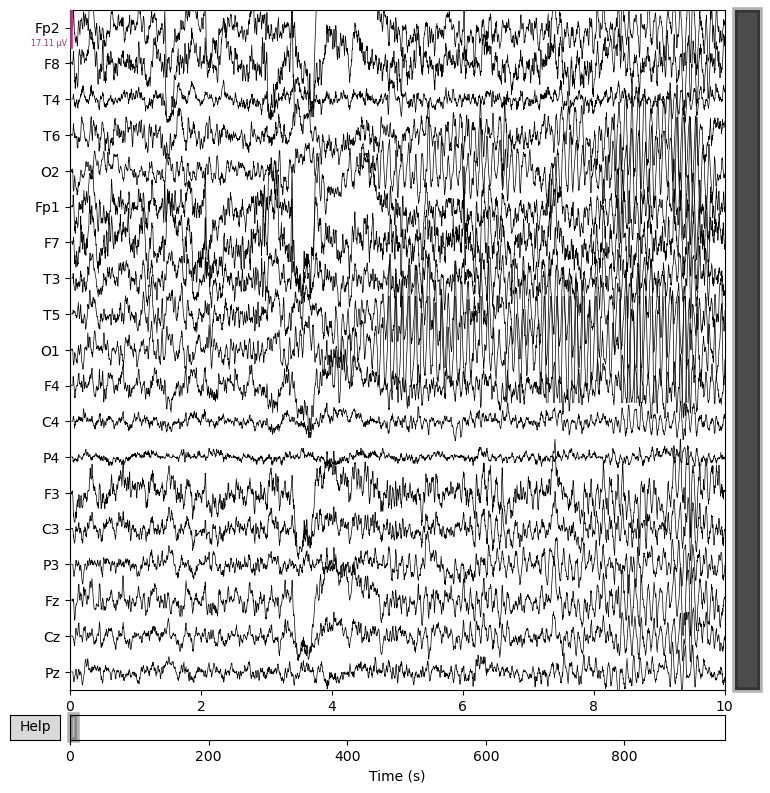

Extracting EDF parameters from /home/pawan/Downloads/Ghanim_machine_learning/data_code/extraction_directory/s07.edf...
EDF file detected
Setting channel info structure...
Creating raw.info structure...
Reading 0 ... 336499  =      0.000 ...  1345.996 secs...


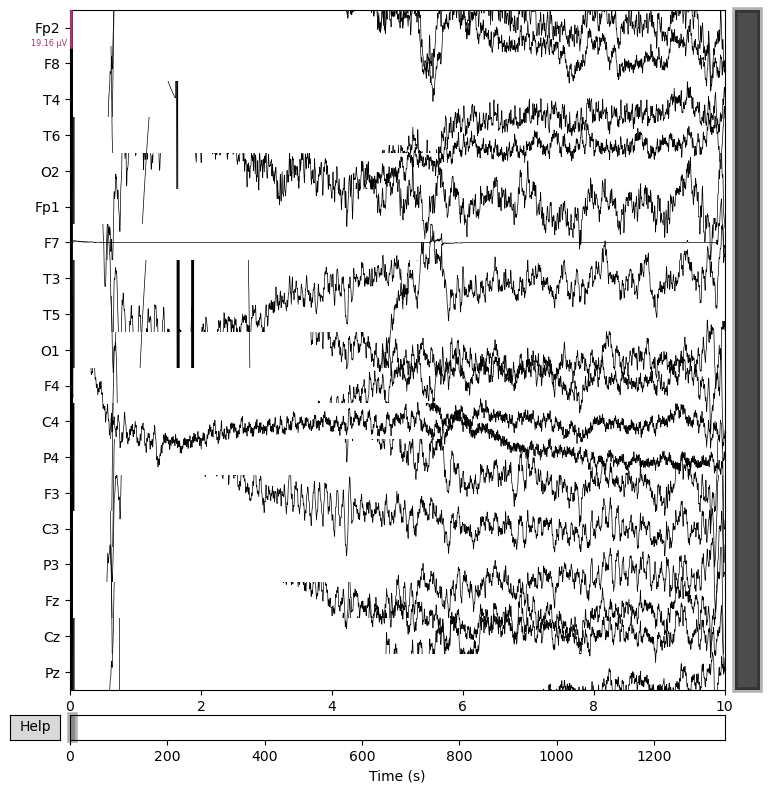

Extracting EDF parameters from /home/pawan/Downloads/Ghanim_machine_learning/data_code/extraction_directory/h07.edf...
EDF file detected
Setting channel info structure...
Creating raw.info structure...
Reading 0 ... 227499  =      0.000 ...   909.996 secs...


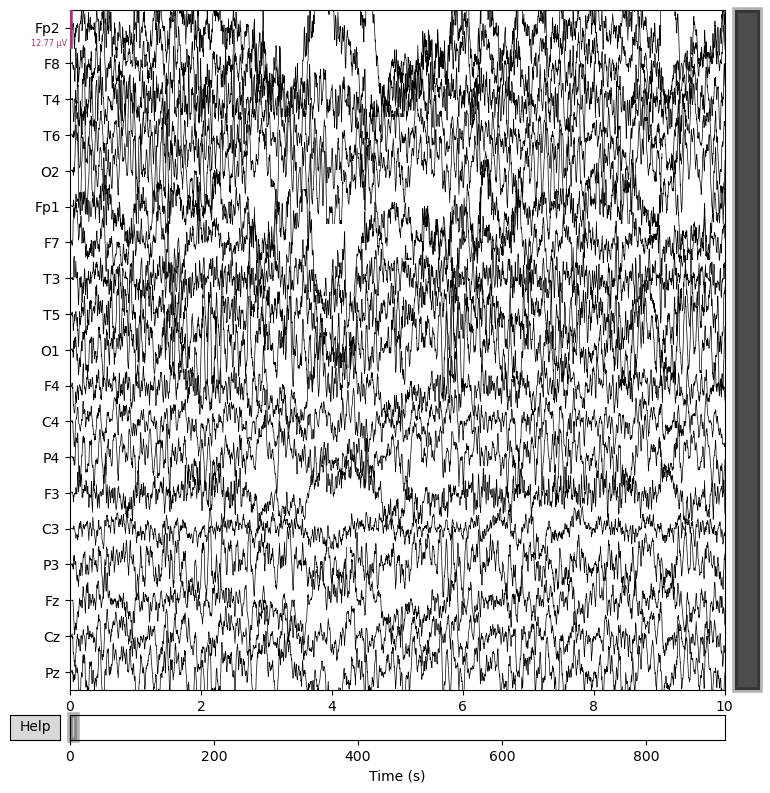

Extracting EDF parameters from /home/pawan/Downloads/Ghanim_machine_learning/data_code/extraction_directory/h14.edf...
EDF file detected
Setting channel info structure...
Creating raw.info structure...
Reading 0 ... 216249  =      0.000 ...   864.996 secs...


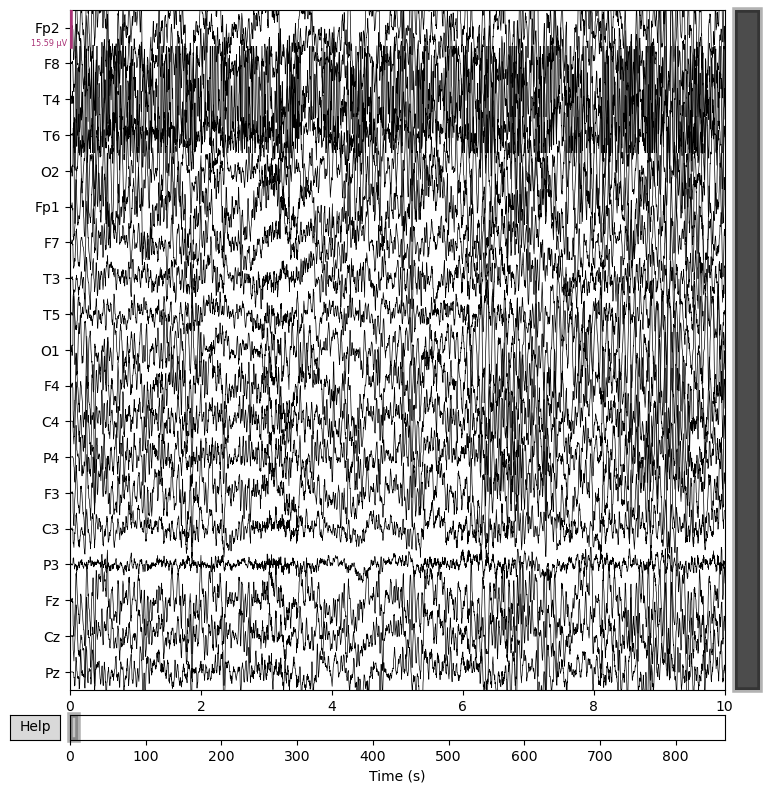

Extracting EDF parameters from /home/pawan/Downloads/Ghanim_machine_learning/data_code/extraction_directory/h09.edf...
EDF file detected
Setting channel info structure...
Creating raw.info structure...
Reading 0 ... 226249  =      0.000 ...   904.996 secs...


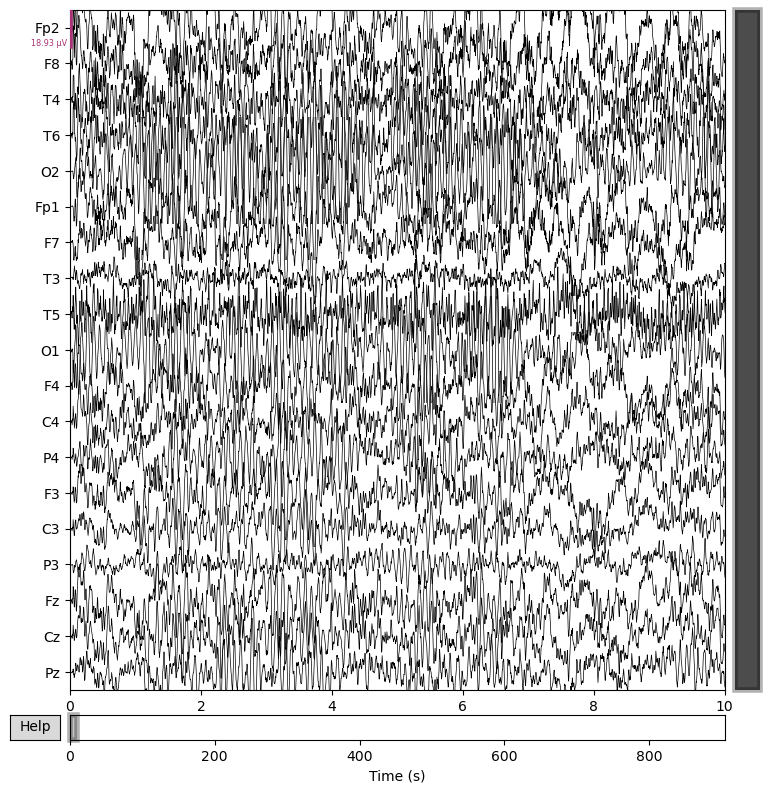

Extracting EDF parameters from /home/pawan/Downloads/Ghanim_machine_learning/data_code/extraction_directory/h01.edf...
EDF file detected
Setting channel info structure...
Creating raw.info structure...
Reading 0 ... 231249  =      0.000 ...   924.996 secs...


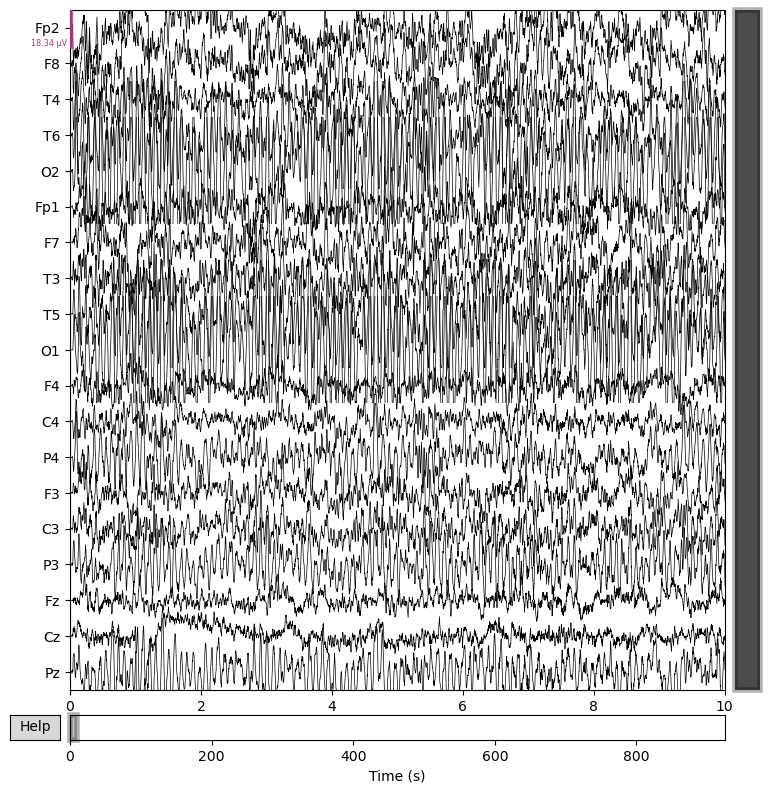

Extracting EDF parameters from /home/pawan/Downloads/Ghanim_machine_learning/data_code/extraction_directory/s12.edf...
EDF file detected
Setting channel info structure...
Creating raw.info structure...
Reading 0 ... 271749  =      0.000 ...  1086.996 secs...


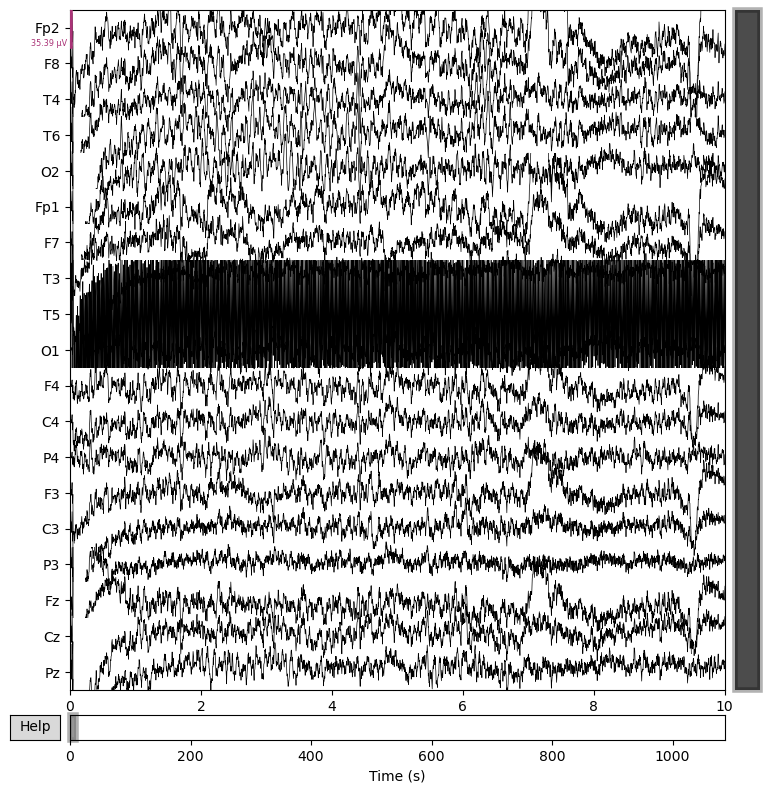

Extracting EDF parameters from /home/pawan/Downloads/Ghanim_machine_learning/data_code/extraction_directory/h13.edf...
EDF file detected
Setting channel info structure...
Creating raw.info structure...
Reading 0 ... 241249  =      0.000 ...   964.996 secs...


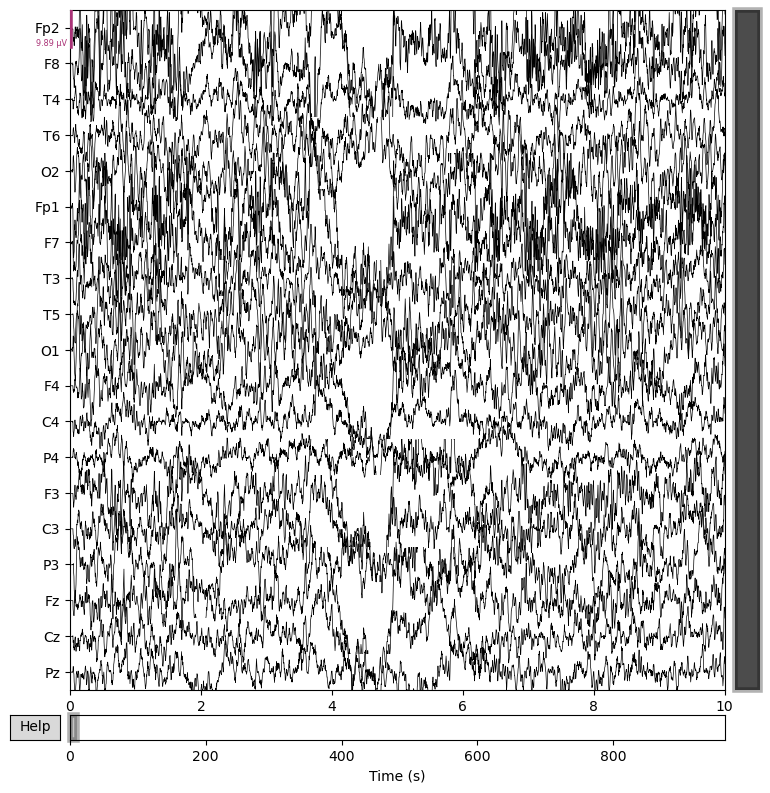

Extracting EDF parameters from /home/pawan/Downloads/Ghanim_machine_learning/data_code/extraction_directory/s03.edf...
EDF file detected
Setting channel info structure...
Creating raw.info structure...
Reading 0 ... 240999  =      0.000 ...   963.996 secs...


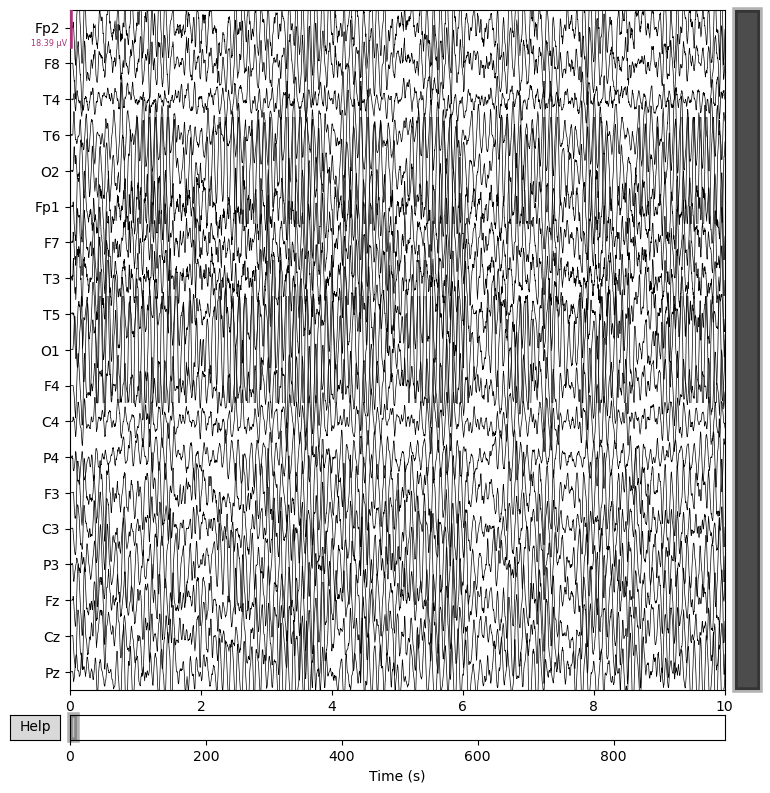

Extracting EDF parameters from /home/pawan/Downloads/Ghanim_machine_learning/data_code/extraction_directory/s09.edf...
EDF file detected
Setting channel info structure...
Creating raw.info structure...
Reading 0 ... 296249  =      0.000 ...  1184.996 secs...


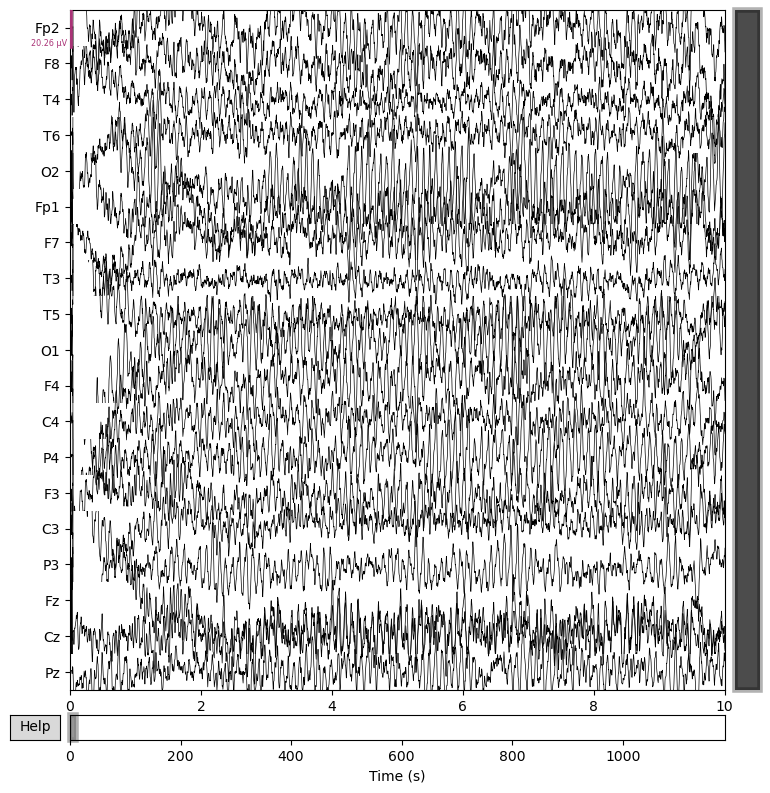

Extracting EDF parameters from /home/pawan/Downloads/Ghanim_machine_learning/data_code/extraction_directory/s13.edf...
EDF file detected
Setting channel info structure...
Creating raw.info structure...
Reading 0 ... 283749  =      0.000 ...  1134.996 secs...


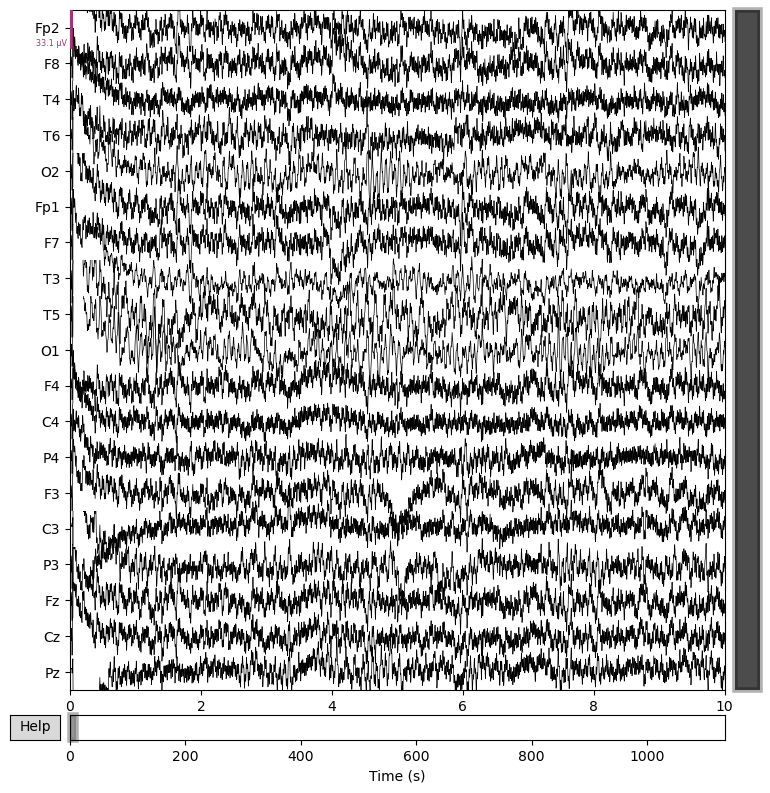

Extracting EDF parameters from /home/pawan/Downloads/Ghanim_machine_learning/data_code/extraction_directory/s10.edf...
EDF file detected
Setting channel info structure...
Creating raw.info structure...
Reading 0 ... 212499  =      0.000 ...   849.996 secs...


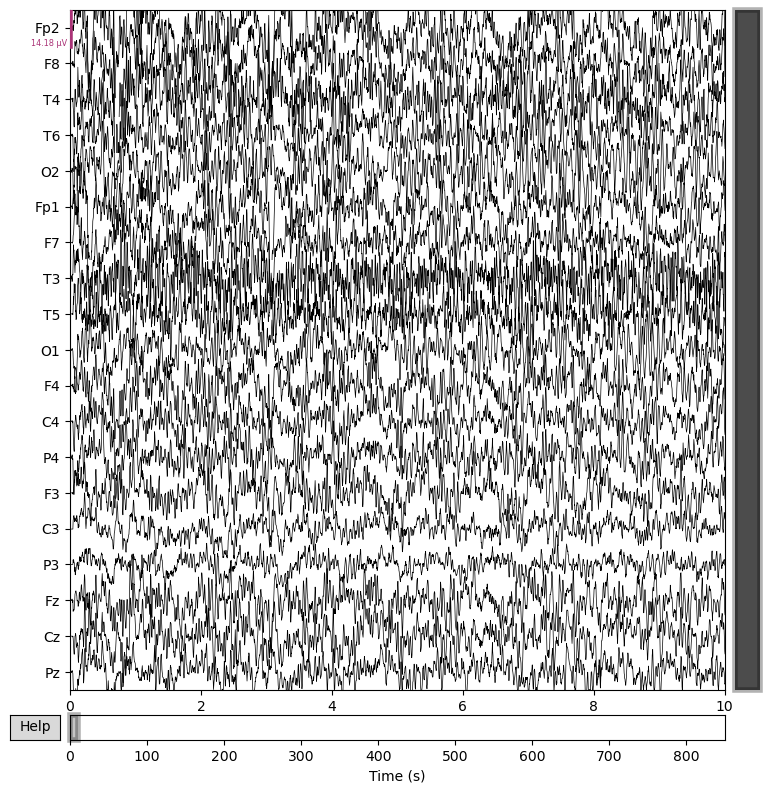

Extracting EDF parameters from /home/pawan/Downloads/Ghanim_machine_learning/data_code/extraction_directory/s01.edf...
EDF file detected
Setting channel info structure...
Creating raw.info structure...
Reading 0 ... 211249  =      0.000 ...   844.996 secs...


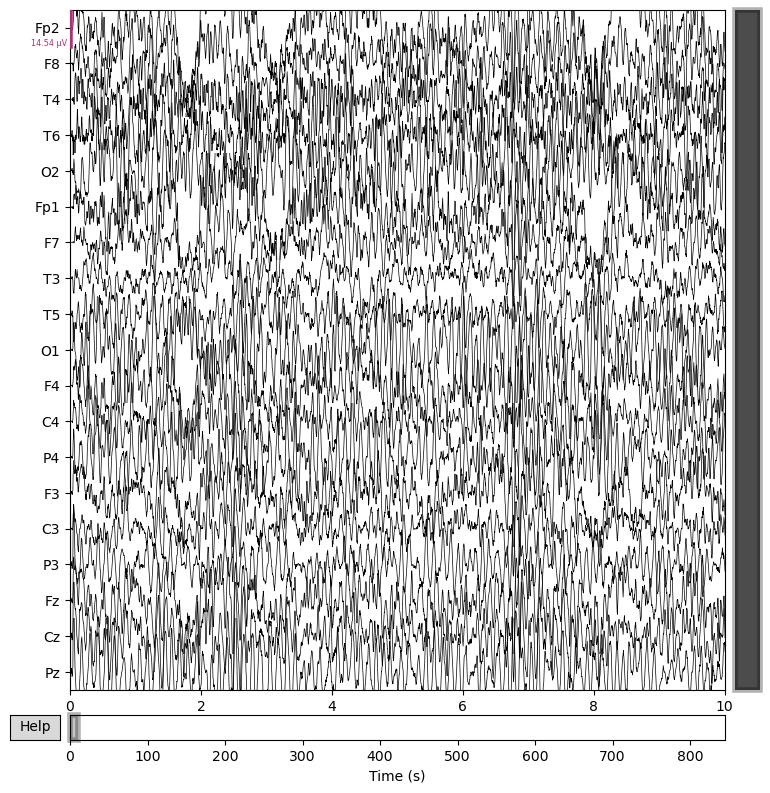

In [22]:
import mne
from glob import glob

# Replace 'extraction_directory/*.edf' with the actual path to your EDF files
edf_files = glob('extraction_directory/*.edf')

# Load the EEG data
for i in range(len(edf_files)):
    raw = mne.io.read_raw_edf(edf_files[i], preload=True)

# Plot the EEG data
    raw.plot(scalings='auto', show=True)

In [23]:
info = raw.info

In [24]:
print(info)

<Info | 8 non-empty values
 bads: []
 ch_names: Fp2, F8, T4, T6, O2, Fp1, F7, T3, T5, O1, F4, C4, P4, F3, C3, ...
 chs: 19 EEG
 custom_ref_applied: False
 highpass: 0.0 Hz
 lowpass: 125.0 Hz
 meas_date: 2004-08-20 12:19:24 UTC
 nchan: 19
 projs: []
 sfreq: 250.0 Hz
 subject_info: 1 item (dict)
>


In [25]:
raw = mne.io.read_raw_edf(edf_files[0], preload=True)

Extracting EDF parameters from /home/pawan/Downloads/Ghanim_machine_learning/data_code/extraction_directory/h03.edf...
EDF file detected
Setting channel info structure...
Creating raw.info structure...
Reading 0 ... 227499  =      0.000 ...   909.996 secs...


In [26]:
print(raw.info)

<Info | 8 non-empty values
 bads: []
 ch_names: Fp2, F8, T4, T6, O2, Fp1, F7, T3, T5, O1, F4, C4, P4, F3, C3, ...
 chs: 19 EEG
 custom_ref_applied: False
 highpass: 0.0 Hz
 lowpass: 125.0 Hz
 meas_date: 2003-07-02 17:56:36 UTC
 nchan: 19
 projs: []
 sfreq: 250.0 Hz
 subject_info: 1 item (dict)
>


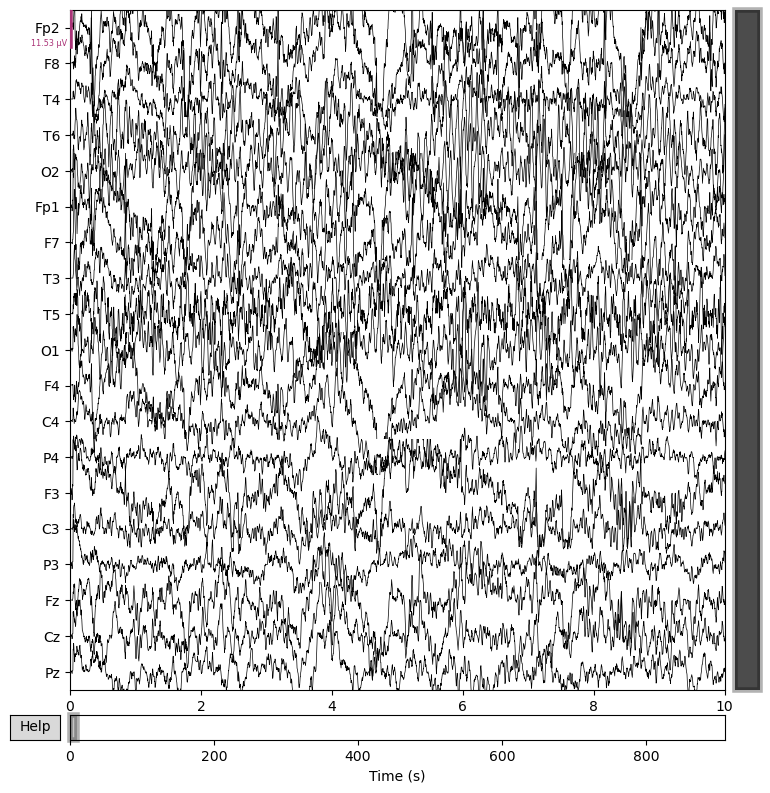

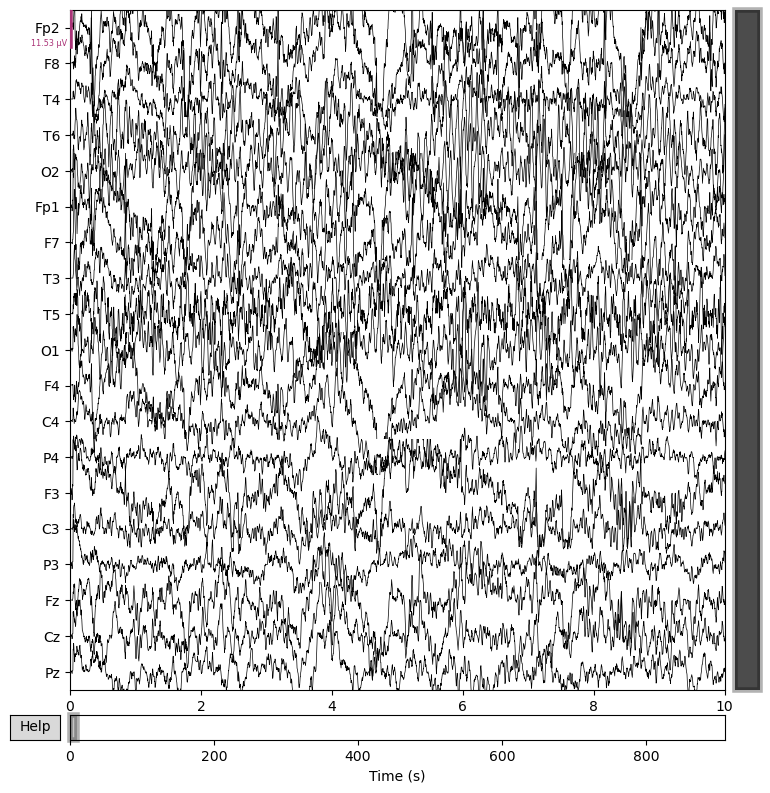

In [27]:
raw.plot(n_channels=30, scalings='auto', title='Raw Data')

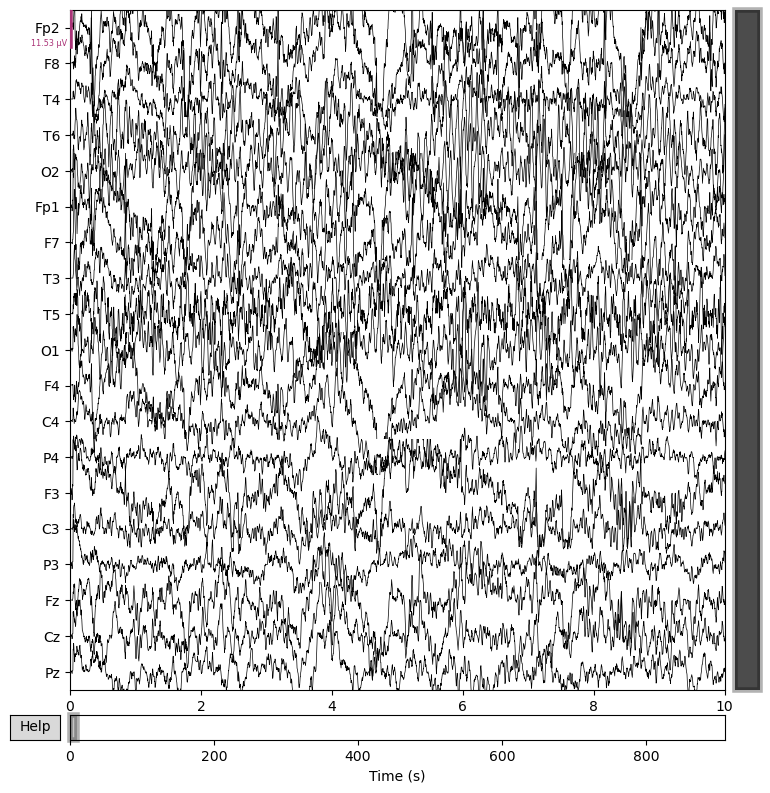

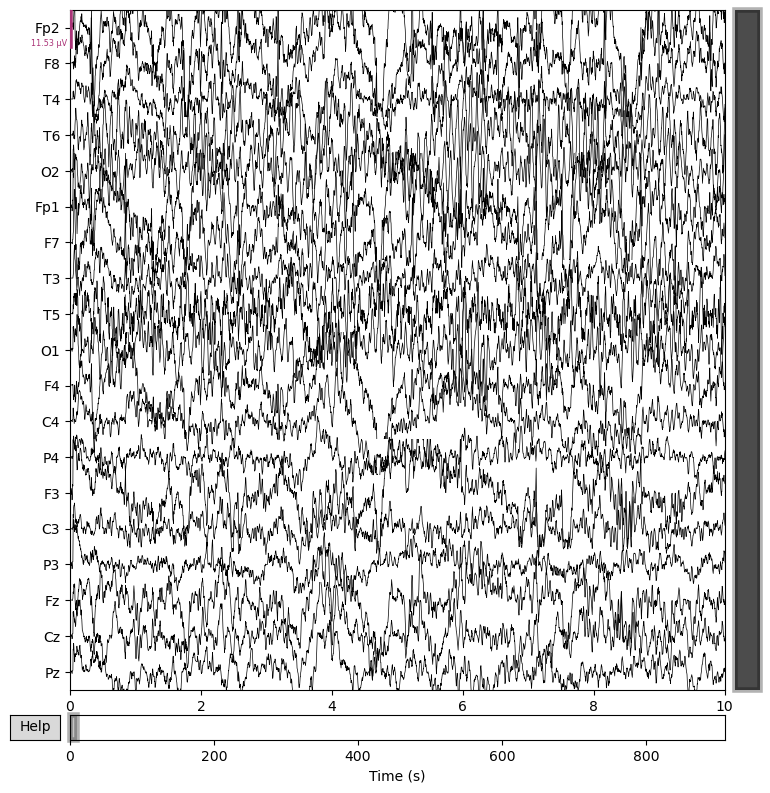

In [28]:
raw.plot(n_channels=19, scalings='auto', title='Raw EEG Data')

NOTE: plot_psd() is a legacy function. New code should use .compute_psd().plot().
Effective window size : 8.192 (s)


/tmp/ipykernel_52761/3370076752.py:1: RuntimeWarning: Channel locations not available. Disabling spatial colors.
  raw.plot_psd(fmax=40)
/home/pawan/anaconda3/lib/python3.10/site-packages/mne/viz/utils.py:165: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  (fig or plt).show(**kwargs)


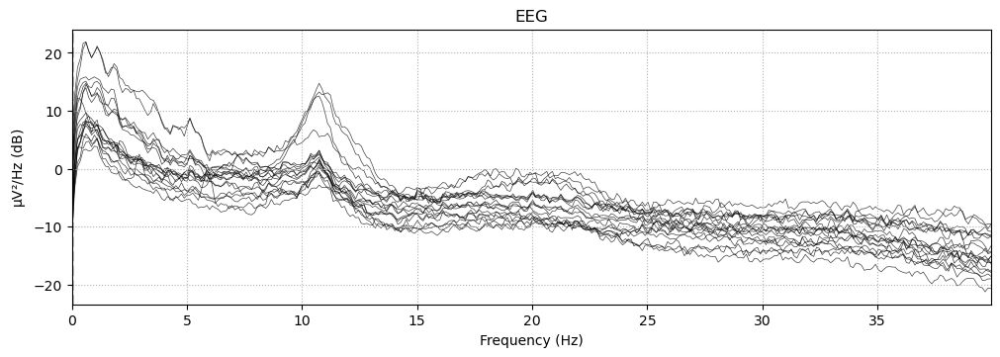

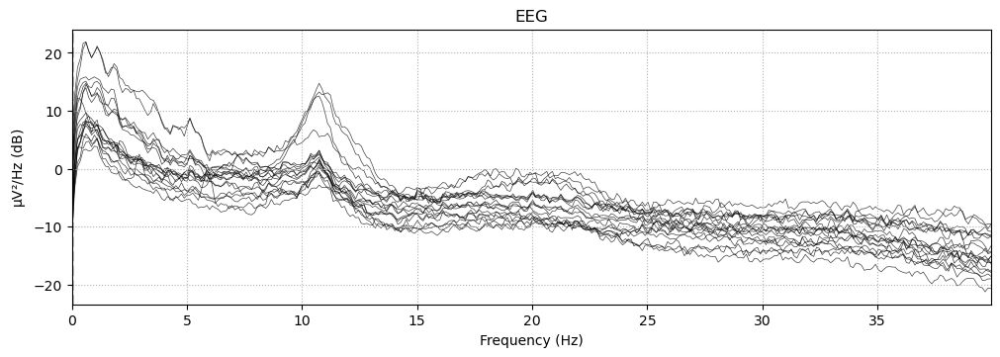

In [29]:
raw.plot_psd(fmax=40)

Epoch 1/5
138/138 [==============================] - 25s 131ms/step - loss: 0.6317 - accuracy: 0.6556 - val_loss: 0.5892 - val_accuracy: 0.6873
Epoch 2/5
138/138 [==============================] - 17s 125ms/step - loss: 0.3978 - accuracy: 0.8267 - val_loss: 0.4499 - val_accuracy: 0.8040
Epoch 3/5
138/138 [==============================] - 17s 126ms/step - loss: 0.2284 - accuracy: 0.9131 - val_loss: 0.4107 - val_accuracy: 0.8341
Epoch 4/5
138/138 [==============================] - 19s 137ms/step - loss: 0.1492 - accuracy: 0.9437 - val_loss: 0.4556 - val_accuracy: 0.8414
Epoch 5/5
138/138 [==============================] - 18s 131ms/step - loss: 0.0954 - accuracy: 0.9688 - val_loss: 0.3777 - val_accuracy: 0.8733


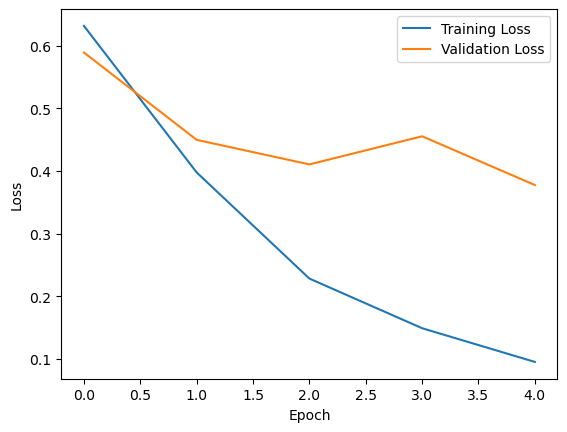

In [44]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import LSTM, Dense, BatchNormalization
from sklearn.preprocessing import StandardScaler
from scipy.fft import fft

# Replace this with your actual EEG data and labels
raw_eeg_data = data_array  # Replace with your actual data
labels = label_array  # Replace with your actual labels

# Apply Fourier transform to each channel
reshaped_data = raw_eeg_data.reshape((5482, -1))
fourier_transformed_data = np.abs(fft(reshaped_data, axis=1))
fourier_transformed_data = fourier_transformed_data.reshape((5482, -1))

# Apply standard scaling
scaler = StandardScaler()
scaled_data = scaler.fit_transform(fourier_transformed_data)

# Reshape the data back to the original shape
scaled_data = scaled_data.reshape((5482, 19, 500))

# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(scaled_data, labels, test_size=0.2, random_state=42)

# Define the model (similar to the previous example)
model = Sequential()
model.add(LSTM(50, input_shape=(19, 500), return_sequences=True))
model.add(BatchNormalization())
model.add(LSTM(50, return_sequences=True))
model.add(BatchNormalization())
model.add(LSTM(50, return_sequences=True))
model.add(BatchNormalization())
model.add(LSTM(50, return_sequences=True))
model.add(BatchNormalization())
model.add(LSTM(50))
model.add(BatchNormalization())
model.add(Dense(1, activation='sigmoid'))

# Compile the model
model.compile(loss='binary_crossentropy', optimizer='adam', metrics=['accuracy'])

# Train the model and get the training history
history = model.fit(X_train, y_train, epochs=5, batch_size=32, validation_data=(X_test, y_test))

# Plot training and validation loss
plt.plot(history.history['loss'], label='Training Loss')
plt.plot(history.history['val_loss'], label='Validation Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()
plt.show()

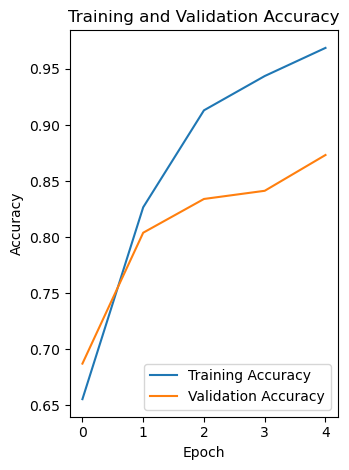

In [45]:
# Plot training accuracy
plt.subplot(1, 2, 2)
plt.plot(history.history['accuracy'], label='Training Accuracy')
plt.plot(history.history['val_accuracy'], label='Validation Accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.title('Training and Validation Accuracy')
plt.legend()

plt.tight_layout()
plt.show()

In [ ]:
print(emd_data)

In [ ]:
plt.subplot(1, 2, 2)
plt.plot(history.history['accuracy'], label='Training Accuracy')
plt.plot(history.history['val_accuracy'], label='Validation Accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.title('Training and Validation Accuracy')
plt.legend()

plt.tight_layout()
plt.show()

In [46]:
# Evaluate the model on the test set
loss, accuracy = model.evaluate(X_test, y_test)

# Print the evaluation results
print("Test Loss:", loss)
print("Test Accuracy:", accuracy)

35/35 [==============================] - 1s 41ms/step - loss: 0.3777 - accuracy: 0.8733
Test Loss: 0.37774667143821716
Test Accuracy: 0.8732907772064209


35/35 [==============================] - 1s 38ms/step


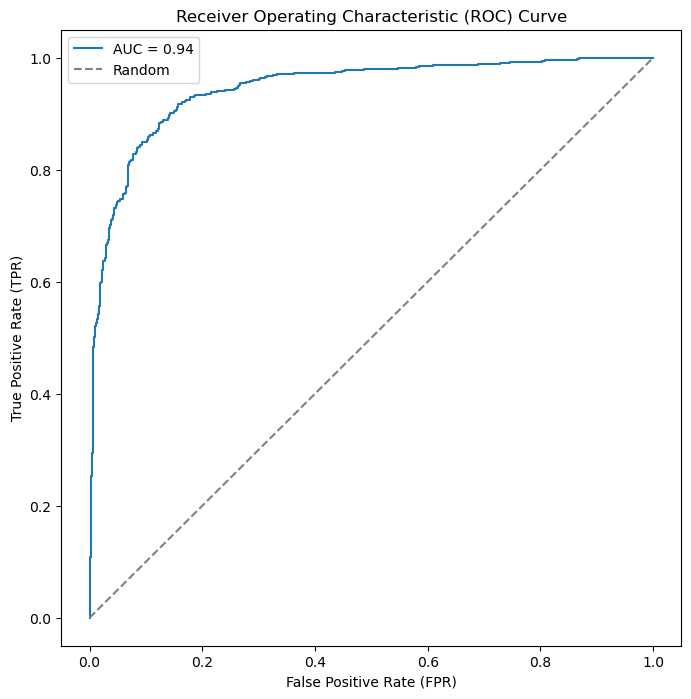

In [63]:
from sklearn.metrics import roc_curve, roc_auc_score,f1_score,confusion_matrix, accuracy_score,precision_score, recall_score
# Make predictions on the test set
y_pred = model.predict(X_test)

# Calculate ROC curve
fpr, tpr, thresholds = roc_curve(y_test, y_pred)

# Calculate AUC
auc = roc_auc_score(y_test, y_pred)

# Plot ROC curve
plt.figure(figsize=(8, 8))
plt.plot(fpr, tpr, label=f'AUC = {auc:.2f}')
plt.plot([0, 1], [0, 1], linestyle='--', color='gray', label='Random')
plt.title('Receiver Operating Characteristic (ROC) Curve')
plt.xlabel('False Positive Rate (FPR)')
plt.ylabel('True Positive Rate (TPR)')
plt.legend()
plt.show()


In [64]:

# Threshold predictions to get binary labels
threshold = 0.5
binary_predictions = (y_pred > threshold).astype(int)

# Calculate F1 score
f1 = f1_score(y_test, binary_predictions)

# Print F1 score
print("F1 Score:", f1)

F1 Score: 0.8706976744186047


In [65]:
# Calculate confusion matrix
conf_matrix = confusion_matrix(y_test, binary_predictions)

# Print confusion matrix
print("Confusion Matrix:")
print(conf_matrix)

Confusion Matrix:
[[490  56]
 [ 83 468]]


In [66]:
# Calculate confusion matrix
conf_matrix = confusion_matrix(y_test, binary_predictions)

# Extract values from confusion matrix
TN, FP, FN, TP = conf_matrix.ravel()

# Print confusion matrix in true positive (TP), true negative (TN) form
print("Confusion Matrix:")
print(f"True Positive (TP): {TP}")
print(f"True Negative (TN): {TN}")
print(f"False Positive (FP): {FP}")
print(f"False Negative (FN): {FN}")

Confusion Matrix:
True Positive (TP): 468
True Negative (TN): 490
False Positive (FP): 56
False Negative (FN): 83


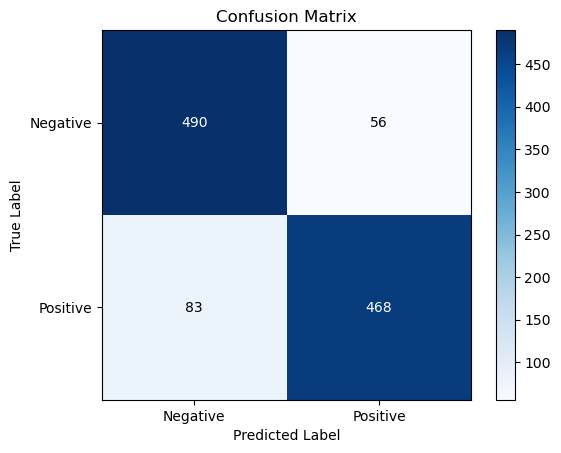

In [67]:
# Plot confusion matrix in color map
plt.imshow(conf_matrix, interpolation='nearest', cmap=plt.cm.Blues)
plt.title('Confusion Matrix')
plt.colorbar()
# Add labels and ticks
classes = ['Negative', 'Positive']
tick_marks = np.arange(len(classes))
plt.xticks(tick_marks, classes)
plt.yticks(tick_marks, classes)
# Display values in each cell
for i in range(len(classes)):
    for j in range(len(classes)):
        plt.text(j, i, format(conf_matrix[i, j], 'd'), ha="center", va="center", color="white" if conf_matrix[i, j] > conf_matrix.max() / 2 else "black")

plt.xlabel('Predicted Label')
plt.ylabel('True Label')
plt.show()

In [68]:
# Extract values from confusion matrix
TN, FP, FN, TP = conf_matrix.ravel()

# Calculate Sensitivity (True Positive Rate or Recall)
sensitivity = TP / (TP + FN)

# Calculate Specificity (True Negative Rate)
specificity = TN / (TN + FP)

# Calculate Accuracy
accuracy = accuracy_score(y_test, binary_predictions)

# Calculate Precision
precision = precision_score(y_test, binary_predictions)

# Calculate F1 Score
f1 = f1_score(y_test, binary_predictions)

# Print the results
print(f"Sensitivity (True Positive Rate): {sensitivity}")
print(f"Specificity (True Negative Rate): {specificity}")
print(f"Accuracy: {accuracy}")
print(f"Precision: {precision}")
print(f"F1 Score: {f1}")


Sensitivity (True Positive Rate): 0.8493647912885662
Specificity (True Negative Rate): 0.8974358974358975
Accuracy: 0.8732907930720146
Precision: 0.8931297709923665
F1 Score: 0.8706976744186047


    Epochs:
        The training process is divided into epochs. Each epoch represents one complete pass through the entire training dataset.

    Loss:
        The loss is a measure of how well the model is performing. It represents the error between the predicted values and the actual labels. Lower values are better. In your case, both training and validation loss are decreasing over epochs, indicating that the model is learning.

    Accuracy:
        Accuracy represents the percentage of correctly classified samples. It ranges from 0 to 1 (or 0% to 100%). Higher accuracy values are desirable. In your case, both training and validation accuracy are increasing over epochs, indicating that the model is improving its ability to correctly classify samples.

    Overfitting:
        Overfitting occurs when the model performs well on the training data but poorly on new, unseen data (validation data). You should monitor the training and validation loss and accuracy. If the training loss continues to decrease while the validation loss increases, it might indicate overfitting.

    Generalization:
        A good model generalizes well to unseen data. You can assess this by comparing the training and validation metrics. If both are improving, the model is likely generalizing well.

In your specific case:

    The training loss is decreasing, which is a positive sign.
    The validation loss is also decreasing, indicating that the model is not overfitting, and it generalizes well to the validation set.
    The training accuracy is increasing, showing that the model is learning from the training data.
    The validation accuracy is also increasing, suggesting that the model is performing well on unseen data.

Overall, based on this information, your model seems to be learning effectively and generalizing well to the validation data. If the performance is satisfactory, you can use this trained model for making predictions on new data.
